In [41]:
##Creators -
#Shreejit Gajanan Deshmukh
#Venkata Advaith Sai Kandiraju
#PRCV Spring 2023' Assignment 5 - Deep learning

In [ ]:
#Summary
#This is an extension to project 5 where we are predicting animal classes.

In [53]:
#Imports
import os
import keras
import numpy as np
from glob import glob
from tqdm import tqdm 

# Data
from keras.preprocessing.image import ImageDataGenerator

# Data Viz
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

# Model
from keras import Sequential
from keras.models import load_model
from keras.layers import Dense, GlobalAvgPool2D as GAP, Dropout

# Callbacks
from keras.callbacks import ModelCheckpoint, EarlyStopping

# Transfer Learning Models
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet_v2 import ResNet152V2

In [42]:
# Main Path
path = 'archive/raw_data'

# Get Class Names
class_names = sorted(os.listdir(path))
n_classes = len(class_names)
print(f"Class Names: \n{class_names}")
print(f"Total Number of Classes : {n_classes}")

Class Names: 
['cane', 'cavallo', 'elefante', 'farfalla', 'gallina', 'gatto', 'mucca', 'pecora', 'ragno', 'scoiattolo']
Total Number of Classes : 10


In [43]:
#Checking class distribution
class_dis = [len(os.listdir(path + f"/{name}")) for name in class_names]
print(f"Class Distribution : \n{class_dis}")

Class Distribution : 
[4863, 2623, 1446, 2112, 3098, 1668, 1866, 1820, 4821, 1862]


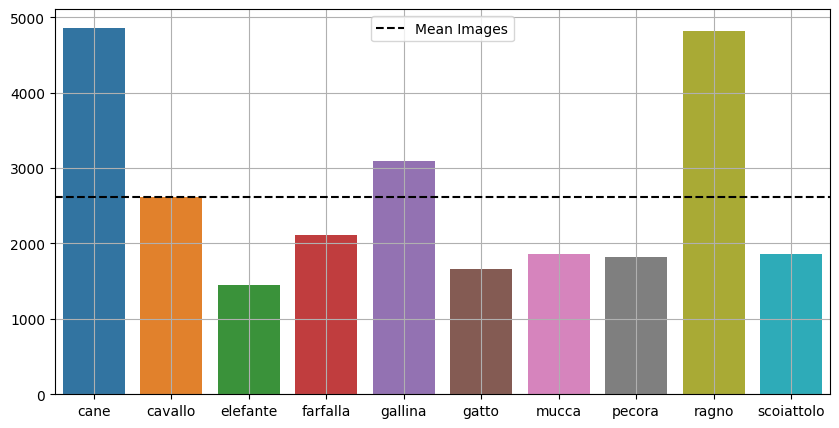

In [44]:
#Visualizing data distribution
plt.figure(figsize=(10,5))
sns.barplot(x=class_names, y=class_dis)
plt.grid()
plt.axhline(np.mean(class_dis), color='k', linestyle='--', label="Mean Images")
plt.legend()
plt.show()

In [45]:
# Initialize Generator 
gen = ImageDataGenerator(
    rescale=1./255, 
    horizontal_flip=True, 
    vertical_flip=True, 
    rotation_range=20, 
    validation_split=0.2)

# Load data
train_ds = gen.flow_from_directory(
    path, 
    target_size=(256,256), 
    class_mode='binary', 
    batch_size=32, 
    shuffle=True, 
    subset='training')

valid_ds = gen.flow_from_directory(
    path, 
    target_size=(256,256), 
    class_mode='binary', 
    batch_size=32, 
    shuffle=True, 
    subset='validation')

Found 20947 images belonging to 10 classes.
Found 5232 images belonging to 10 classes.


In [46]:
#function to display image
def show_image(img, title=None):
    '''The function takes in a Image and plots it'''
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')

In [47]:
#function to get random image
def get_random_data(data):
    images, labels = data
    id = np.random.randint(len(images))
    image, label = images[id], labels[id]
    return image, label

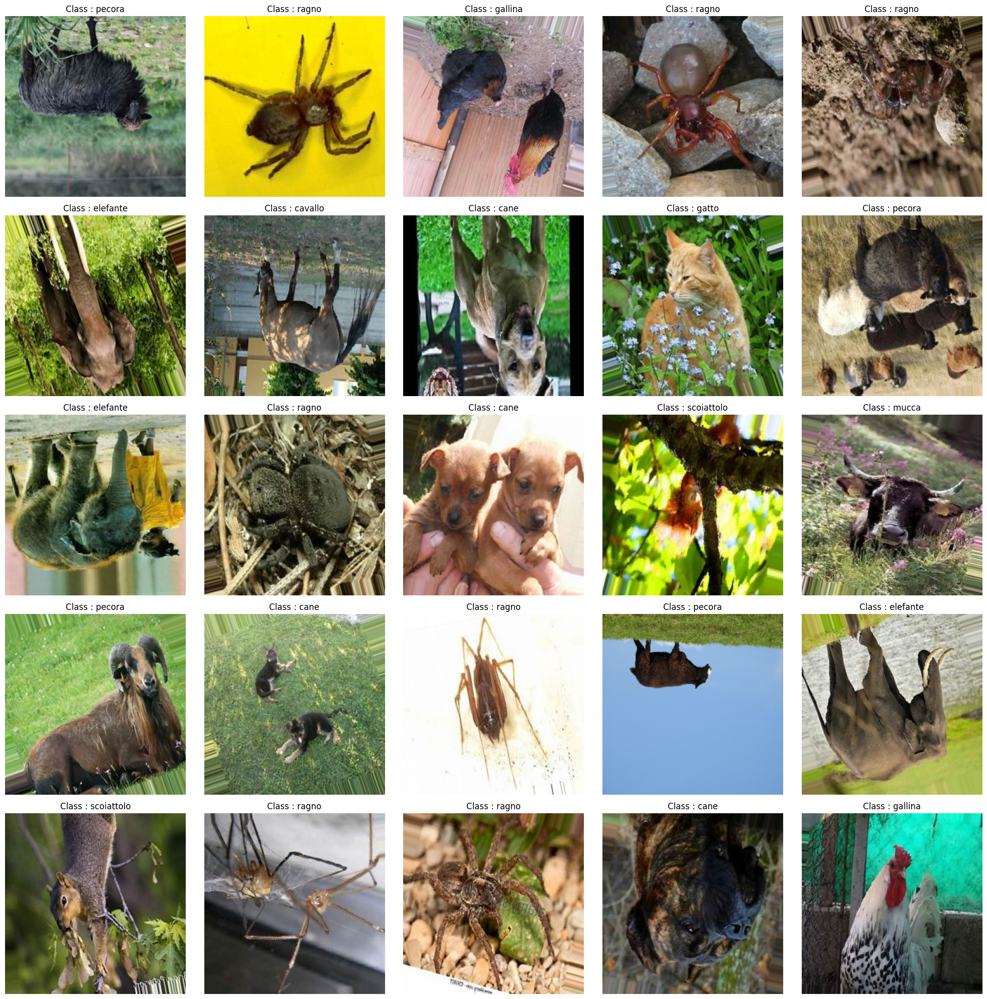

In [48]:
#checking data
plt.figure(figsize=(20,20))
i=1
for images, labels in iter(train_ds):
    
    # Get Random Image and label
    image, label = get_random_data([images, labels])
    
    # Plot it
    plt.subplot(5,5,i)
    show_image(image, title=f"Class : {class_names[int(label)]}")
    
    # Make sure to end the Loop
    i+=1
    if i>=26: break
        

plt.tight_layout()
plt.show()

In [49]:
# Specify Model Name
name = "ResNet152V2"

# Pretrained Model
base_model = ResNet152V2(include_top=False, input_shape=(256,256,3), weights='imagenet')
base_model.trainable = False # Freeze the Weights

# Model 
resnet152V2 = Sequential([
    base_model,
    GAP(),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(n_classes, activation='softmax')
], name=name)

# Compile
resnet152V2.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Callbacks 
cbs = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint(name + ".h5", save_best_only=True)
]

# Train Model
resnet152V2.fit(
    train_ds, validation_data=valid_ds,
    epochs=5, callbacks=cbs
)

Epoch 1/10
655/655 [==============================] - 2754s 4s/step - loss: 0.4004 - accuracy: 0.8723 - val_loss: 0.2715 - val_accuracy: 0.9065
Epoch 2/10
655/655 [==============================] - 2768s 4s/step - loss: 0.2753 - accuracy: 0.9100 - val_loss: 0.2379 - val_accuracy: 0.9211
Epoch 3/10
655/655 [==============================] - 2755s 4s/step - loss: 0.2448 - accuracy: 0.9197 - val_loss: 0.2508 - val_accuracy: 0.9169
Epoch 4/10
655/655 [==============================] - 2742s 4s/step - loss: 0.2290 - accuracy: 0.9249 - val_loss: 0.2400 - val_accuracy: 0.9190
Epoch 5/10
655/655 [==============================] - 2904s 4s/step - loss: 0.2147 - accuracy: 0.9279 - val_loss: 0.2690 - val_accuracy: 0.9149


In [50]:
model = load_model('ResNet152V2.h5')
model.summary()

Model: "ResNet152V2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet152v2 (Functional)    (None, 8, 8, 2048)        58331648  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_2 (Dense)             (None, 256)               524544    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_3 (Dense)             (None, 10)                2570      
                                                                 
Total params: 58,858,762
Trainable params: 527,114
Non-trainable params: 58,331,648
_____________________________________

In [51]:
model.evaluate(valid_ds)

164/164 [==============================] - 552s 3s/step - loss: 0.2368 - accuracy: 0.9207


[0.23682865500450134, 0.9206804037094116]

1/1 [==============================] - 0s 481ms/step


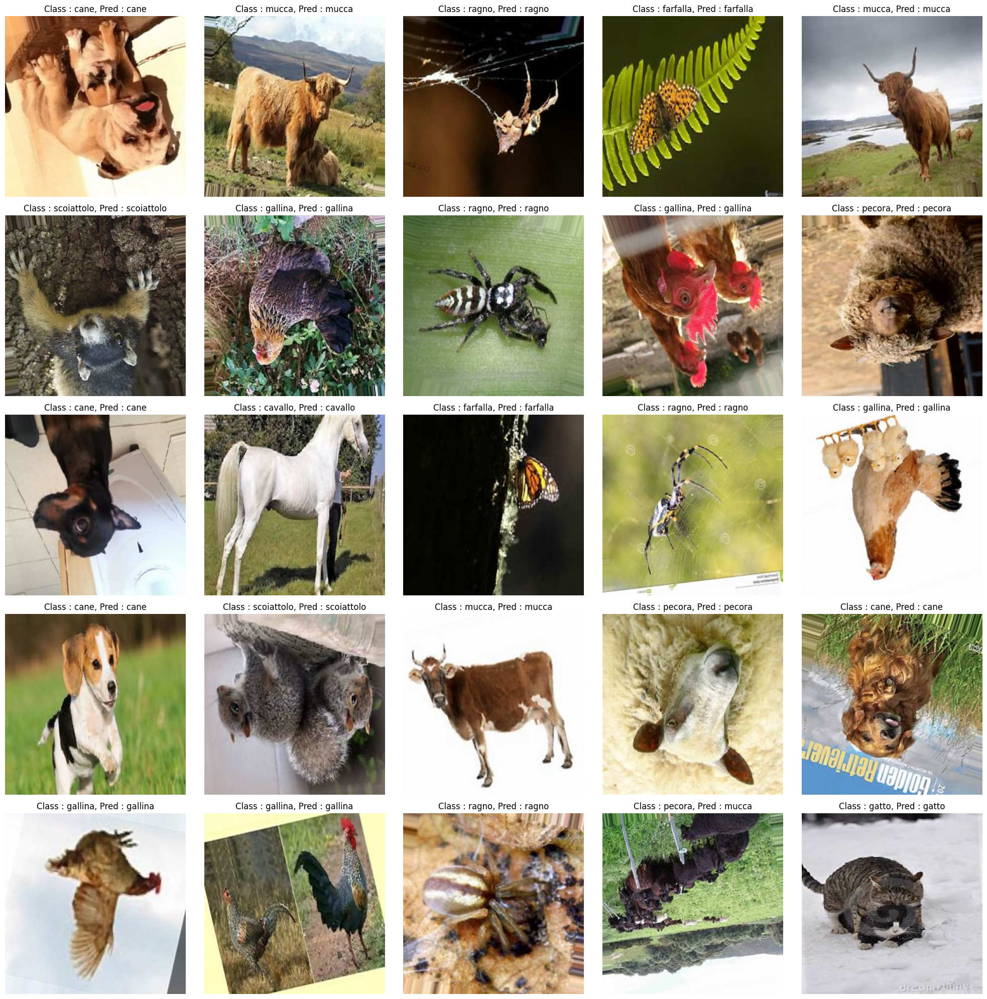

In [52]:
#Prediction visualization
plt.figure(figsize=(20,20))
i=1
for images, labels in iter(valid_ds):
    
    # Get Random Image and label
    image, label = get_random_data([images, labels])
    pred_label = class_names[np.argmax(model.predict(image[np.newaxis,...]))]
    
    # Plot it
    plt.subplot(5,5,i)
    show_image(image, title=f"Class : {class_names[int(label)]}, Pred : {pred_label}")
    
    # Make sure to end the Loop
    i+=1
    if i>=26: break
        

plt.tight_layout()
plt.show()